In [ ]:
import pandas as pd
import numpy as np
import os
import tarfile
from collections import defaultdict
from urllib.request import urlopen

### 1.  Download labeled faces in the wild (LFW) dataset

In [ ]:
# Download the dataset
url = "http://vis-www.cs.umass.edu/lfw/lfw.tgz"
download_path = "lfw.tgz"

with urlopen(url) as response, open(download_path, 'wb') as out_file:                      # https://stackoverflow.com/questions/7243750/download-file-from-web-in-python-3
    out_file.write(response.read())

# Extract the dataset
with tarfile.open(download_path, 'r:gz') as tar_ref:
    tar_ref.extractall("lfw_dataset")

# Print the list of persons in the dataset
persons_list = os.listdir("lfw_dataset/lfw")
print("List of persons in the dataset:", len(persons_list))
print(persons_list)

List of persons in the dataset: 5749
['Dan_Bartlett', 'Edward_Egan', 'Michelle_Chiklis', 'Guy_Hemmings', 'John_Brady', 'Pedro_Pauleta', 'Janet_Chandler', 'Chuck_Eidson', 'Franklin_Damann', 'Pedro_Alvarez', 'Hipolito_Mejia', 'Piotr_Anderszewski', 'Bill_Lerach', 'Kevin_Hearn', 'Agnes_Bruckner', 'Lou_Piniella', 'Russell_Simmons', 'Maria_Conchita_Alonso', 'Janela_Jara', 'Jakob_Kellenberger', 'Fann_Wong', 'Ethan_Hawke', 'Richie_Adubato', 'Tonya_Payne', 'Eminem', 'Daniele_Nardello', 'Keiko_Sofia_Fujimori', 'Hans-Christian_Schmid', 'Andrei_Mikhnevich', 'Zhu_Rongji', 'John_Ashcroft', 'Jo_Joong-hyon', 'Dick_Smothers', 'Luca_Cordero_di_Montezemolo', 'Brian_Jordan', 'Suzanne_Torrance', 'Rod_Thorn', 'Roger_Daltrey', 'Franco_Cangele', 'Candace_Sutton', 'Josh_Childress', 'Augusto_Roa_Bastos', 'Robert_Torricelli', 'Stanley_Nelson', 'Hamzah_Haz', 'Lloyd_Novick', 'John_Eastman', 'John_Gruden', 'Angelica_Romero', 'Naomi_Watts', 'Francis_Crick', 'Walt_Harris', 'Bob_Dole', 'Roberto_Laratro', 'John_Belushi

### 2. Get the number of persons who have more than one image

In [ ]:
# Count persons with more than one image
person_image_count = defaultdict(int)

for person_folder in os.listdir("lfw_dataset/lfw"):
    person_path = os.path.join("lfw_dataset/lfw", person_folder)
    if os.path.isdir(person_path):
        image_count = len(os.listdir(person_path))
        person_image_count[person_folder] = image_count

# Filter persons with more than one image
persons_with_multiple_images = {person: count for person, count in person_image_count.items() if count > 1}

persons_with_single_image = {person: count for person, count in person_image_count.items() if count == 1}

# Print the result
print("\nNumber of persons with more than one image:", len(persons_with_multiple_images))
print(persons_with_multiple_images)

print("\nNumber of persons with one image:", len(persons_with_single_image))
print(persons_with_single_image)


Number of persons with more than one image: 1680
{'Guy_Hemmings': 2, 'John_Brady': 2, 'Hipolito_Mejia': 4, 'Lou_Piniella': 3, 'Russell_Simmons': 5, 'Ethan_Hawke': 4, 'Richie_Adubato': 2, 'Andrei_Mikhnevich': 2, 'Zhu_Rongji': 9, 'John_Ashcroft': 53, 'Augusto_Roa_Bastos': 2, 'Robert_Torricelli': 3, 'Hamzah_Haz': 2, 'Naomi_Watts': 22, 'Bob_Dole': 3, 'Bobby_Goldwater': 2, 'Jayson_Williams': 3, 'Russell_Coutts': 2, 'Oleksandr_Moroz': 2, 'George_Pataki': 5, 'Boris_Yeltsin': 2, 'Nebojsa_Pavkovic': 2, 'Adel_Al-Jubeir': 3, 'Angela_Lansbury': 2, 'Harbhajan_Singh': 2, 'David_Dodge': 2, 'Rebecca_Romijn-Stamos': 4, 'Mike_Brey': 2, 'Al_Gore': 8, 'Shane_Mosley': 2, 'Donatella_Versace': 3, 'Jesse_Jackson': 9, 'Beth_Jones': 2, 'David_Spade': 2, 'Saeb_Erekat': 2, 'Jacques_Rogge': 10, 'Jean_Charest': 17, 'Lisa_Gottsegen': 2, 'Robert_DeFraites': 2, 'Jim_Tressel': 4, 'Serena_Williams': 52, 'Paul_Sarbanes': 3, 'Phil_Vassar': 2, 'Abdullah': 4, 'Hayley_Tullett': 2, 'Placido_Domingo': 3, 'Ali_Khamenei': 3, 'M

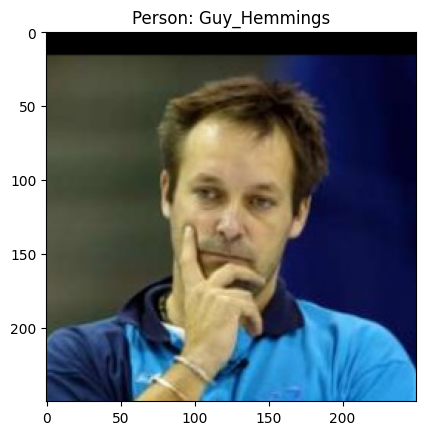

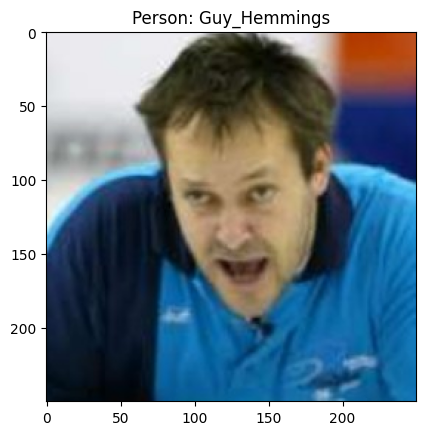

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i in range(2):
# Display a random image from a person with multiple images
  person_with_multiple_images = next(iter(persons_with_multiple_images.keys()))
  image_path = os.path.join("lfw_dataset/lfw", person_with_multiple_images, os.listdir(os.path.join("lfw_dataset/lfw", person_with_multiple_images))[i])

  img = mpimg.imread(image_path)
  plt.imshow(img)
  plt.title(f"Person: {person_with_multiple_images}")
  plt.show()

### 3. Split into training, validation, and testing by person (not by image)

In [ ]:
import cv2

desired_size = (224, 224)
def load_and_preprocess_image(file_path):
    # Load the image using OpenCV
    img = cv2.imread(file_path)

    # Convert the image to RGB (OpenCV uses BGR by default)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Crop the image to a square aspect ratio (center crop)
    h, w, _ = img.shape
    min_dim = min(h, w)
    start_h = (h - min_dim) // 2
    start_w = (w - min_dim) // 2
    img = img[start_h:start_h + min_dim, start_w:start_w + min_dim]

    # Resize the image to the desired size
    img = cv2.resize(img, desired_size)

    # Normalize the pixel values to be in the range [0, 1]
    img = img.astype(np.float32) / 255.0

    # Additional processing steps if needed

    return img

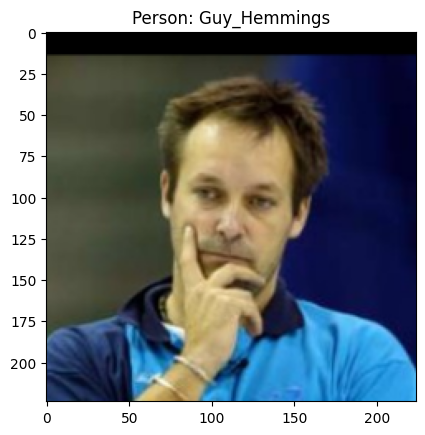

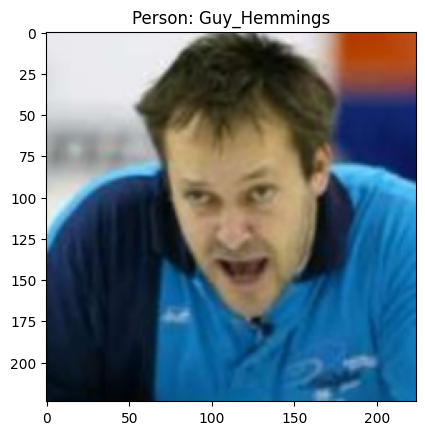

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i in range(2):
# Display a random image from a person with multiple images
  person_with_multiple_images = next(iter(persons_with_multiple_images.keys()))
  image_path = os.path.join("lfw_dataset/lfw", person_with_multiple_images, os.listdir(os.path.join("lfw_dataset/lfw", person_with_multiple_images))[i])

  # img = mpimg.imread(image_path)
  reimg = load_and_preprocess_image(image_path)
  plt.imshow(reimg)
  plt.title(f"Person: {person_with_multiple_images}")
  plt.show()

In [ ]:
import os
import random
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# path to the root directory containing the images
data_root = "lfw_dataset/lfw"

# Create pairs for persons with multiple images
pairs_multiple_images = []
cnt1 = 0
for person in persons_with_multiple_images:
    image_files = os.listdir(os.path.join(data_root, person))

    for i in range(len(image_files)):
        for j in range(i + 1, len(image_files)):
            img1_path = os.path.join(data_root, person, image_files[i])
            img2_path = os.path.join(data_root, person, image_files[j])

            img1 = load_and_preprocess_image(img1_path)
            img2 = load_and_preprocess_image(img2_path)

            pairs_multiple_images.append((img1, img2, 1))  # Label 1 indicates they are of the same person
            cnt1 += 1
            if cnt1 >= 1500:
                break
        if cnt1 >= 1500:
            break

    image_file1 = image_files[0]
    remaining_persons = [p for p in persons_with_multiple_images if p != person]
    random.shuffle(remaining_persons)
    person2 = remaining_persons[0]
    image_file2 = os.listdir(os.path.join(data_root, person2))[0]

    img1_path = os.path.join(data_root, person, image_file1)
    img2_path = os.path.join(data_root, person2, image_file2)
    img1 = load_and_preprocess_image(img1_path)
    img2 = load_and_preprocess_image(img2_path)
    pairs_multiple_images.append((img1, img2, 1))


# pairs_single_image = []
# # Convert persons_with_single_image to a list
# single_image_persons = list(persons_with_single_image.keys())
# for person in single_image_persons:
#     image_files = os.listdir(os.path.join(data_root, person))
#     # Skip persons with no images (although they should not be in single_image_persons)
#     if not image_files:
#         continue
#     # Select the first image for the pair
#     image_file1 = image_files[0]
#     # Select a random person for the second image (excluding the current person)
#     remaining_persons = [p for p in single_image_persons if p != person]
#     random.shuffle(remaining_persons)

#     # Select the first person from the shuffled list
#     person2 = remaining_persons[0]
#     image_file2 = os.listdir(os.path.join(data_root, person2))[0]

#     img1_path = os.path.join(data_root, person, image_file1)
#     img2_path = os.path.join(data_root, person2, image_file2)
#     img1 = load_and_preprocess_image(img1_path)
#     img2 = load_and_preprocess_image(img2_path)

#     # Form the pair
#     pair = (img1, img2, 0)

#     pairs_single_image.append(pair)


# Combine the pairs from both groups
all_pairs = pairs_multiple_images
# Shuffle the dataset
random.shuffle(all_pairs)




In [ ]:
# Split into training, validation, and test sets (adjust ratios as needed)
split_idx1 = int(0.8 * len(all_pairs))
split_idx2 = int(0.9 * len(all_pairs))

train_set = all_pairs[:split_idx1]
val_set = all_pairs[split_idx1:split_idx2]
test_set = all_pairs[split_idx2:]

# Image augmentation transforms
augmentation_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
])

# Example usage in PyTorch dataset
class SiameseDataset(Dataset):
    def __init__(self, pairs, transform=None):
        self.pairs = pairs
        self.transform = transform

    def __getitem__(self, index):
        img1_path, img2_path, label = self.pairs[index]
        img1 = Image.open(os.path.join(data_root, img1_path)).convert("RGB")
        img2 = Image.open(os.path.join(data_root, img2_path)).convert("RGB")

        # Apply image augmentation if specified
        if self.transform:
            img1 = self.transform(img1)
            img2 = self.transform(img2)

        return img1, img2, label

    def __len__(self):
        return len(self.pairs)

# Instantiate the datasets with augmentation
train_dataset = SiameseDataset(train_set, transform=augmentation_transform)
val_dataset = SiameseDataset(val_set)
test_dataset = SiameseDataset(test_set)

In [ ]:
print(len(pairs_multiple_images))
# print(len(pairs_single_image))
all_pairs

4846


[(array([[[0.9607843 , 0.1882353 , 0.28235295],
          [0.94509804, 0.15686275, 0.2509804 ],
          [0.9490196 , 0.11764706, 0.21960784],
          ...,
          [0.6509804 , 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ]],
  
         [[0.9607843 , 0.17254902, 0.27450982],
          [0.95686275, 0.14509805, 0.24705882],
          [0.9607843 , 0.11764706, 0.21568628],
          ...,
          [0.6509804 , 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ]],
  
         [[0.9764706 , 0.16078432, 0.26666668],
          [0.96862745, 0.14117648, 0.24313726],
          [0.972549  , 0.10980392, 0.21568628],
          ...,
          [0.65882355, 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ]],
  
         ...,
  
         [[0.72156864, 0.01568628, 0.01960784],
          [0.7

In [ ]:
train_set

[(array([[[0.9607843 , 0.1882353 , 0.28235295],
          [0.94509804, 0.15686275, 0.2509804 ],
          [0.9490196 , 0.11764706, 0.21960784],
          ...,
          [0.6509804 , 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ]],
  
         [[0.9607843 , 0.17254902, 0.27450982],
          [0.95686275, 0.14509805, 0.24705882],
          [0.9607843 , 0.11764706, 0.21568628],
          ...,
          [0.6509804 , 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ]],
  
         [[0.9764706 , 0.16078432, 0.26666668],
          [0.96862745, 0.14117648, 0.24313726],
          [0.972549  , 0.10980392, 0.21568628],
          ...,
          [0.65882355, 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ],
          [0.6509804 , 0.        , 0.        ]],
  
         ...,
  
         [[0.72156864, 0.01568628, 0.01960784],
          [0.7

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision.models import resnet50
from tqdm import tqdm

# Siamese network definition
class SiameseNetwork(nn.Module):
    def __init__(self, pretrained=True, embedding_dim=64):
        super(SiameseNetwork, self).__init__()
        self.resnet = resnet50(pretrained=pretrained)
        self.fc = nn.Linear(2048, embedding_dim)  # Output dimension of the last layer of ResNet50 is 2048

    def forward_once(self, x):
        x = self.resnet(x)
        x = x.view(x.size()[0], -1)
        x = self.fc(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

# Contrastive loss
class ContrastiveLoss(nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = nn.functional.pairwise_distance(output1, output2)
        loss_contrastive = torch.mean((1 - label) * torch.pow(euclidean_distance, 2) +
                                      (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))
        return loss_contrastive

In [ ]:
# Validation function
def validate_siamese_network(val_dataloader, model, criterion, device='cpu'):
    model.eval()
    model.to(device)
    criterion.to(device)

    running_loss = 0.0
    with torch.no_grad():
        for img1, img2, label in tqdm(val_dataloader, desc="Validation"):
            img1, img2, label = img1.to(device), img2.to(device), label.to(device)

            output1, output2 = model(img1, img2)
            loss = criterion(output1, output2, label)

            running_loss += loss.item()

    average_loss = running_loss / len(val_dataloader)
    print(f"Validation Loss: {average_loss}")

    return average_loss

# Updated training function with validation
def train_siamese_network_with_validation(train_dataloader, val_dataloader, model, criterion, optimizer, num_epochs=10, device='cpu'):
    model.train()
    model.to(device)
    criterion.to(device)

    for epoch in range(num_epochs):
        running_loss = 0.0
        for img1, img2, label in tqdm(train_dataloader, desc=f"Epoch {epoch + 1} (Training)"):
            img1, img2, label = img1.to(device), img2.to(device), label.to(device)

            optimizer.zero_grad()

            output1, output2 = model.forward_once(img1), model.forward_once(img2)
            loss = criterion(output1, output2, label)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        average_loss = running_loss / len(train_dataloader)
        print(f"Epoch {epoch + 1}, Training Loss: {average_loss}")

        # Validate
        validate_siamese_network(val_dataloader, model, criterion, device)


train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
val_dataloader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=2)

# Instantiate the Siamese network, loss function, and optimizer
siamese_net = SiameseNetwork(pretrained=True, embedding_dim = 128)
contrastive_loss = ContrastiveLoss()
optimizer = optim.Adam(siamese_net.parameters(), lr=0.001)

# Train the Siamese network with validation
train_siamese_network_with_validation(train_dataloader, val_dataloader, siamese_net, contrastive_loss, optimizer, num_epochs=5, device='cpu')


Epoch 1 (Training):   0%|          | 0/133 [00:31<?, ?it/s]


RuntimeError: ignored

In [ ]:
from sklearn.model_selection import train_test_split

# Create DataFrame with anchor, positive, and negative samples
data = []

for person in persons_with_multiple_images:
    person_path = os.path.join("lfw_dataset/lfw", person)
    image_list = os.listdir(person_path)

    # Sample anchor and positive images
    anchor, positive = train_test_split(image_list, test_size=0.2, random_state=42)

    # Sample negative images from other persons
    other_persons = list(persons_with_multiple_images.keys())
    other_persons.remove(person)
    negative_person = np.random.choice(other_persons)
    negative = np.random.choice(os.listdir(os.path.join("lfw_dataset/lfw", negative_person)))

    data.append([os.path.join(person_path, anchor[0]),
                 os.path.join(person_path, positive[0]),
                 os.path.join("lfw_dataset/lfw", negative_person, negative)])  # 1 indicates that anchor and positive belong to the same person

# Create DataFrame
columns = ["Anchor", "Positive", "Negative"]#, "Label"]
df = pd.DataFrame(data, columns=columns)

# Step 3: Split into training, validation, and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.1, random_state=42)

In [ ]:
print("\nTraining Set:", len(train_df))
print(train_df.head())

print("\nValidation Set:", len(val_df))
print(val_df.head())

print("\nTesting Set:", len(test_df))
print(test_df.head())


Training Set: 1209
                                                 Anchor  \
909   lfw_dataset/lfw/Michelle_Pfeiffer/Michelle_Pfe...   
765      lfw_dataset/lfw/Dalai_Lama/Dalai_Lama_0002.jpg   
1361     lfw_dataset/lfw/John_Brady/John_Brady_0001.jpg   
264    lfw_dataset/lfw/Liam_Neeson/Liam_Neeson_0001.jpg   
441   lfw_dataset/lfw/Elena_Bovina/Elena_Bovina_0003...   

                                               Positive  \
909   lfw_dataset/lfw/Michelle_Pfeiffer/Michelle_Pfe...   
765      lfw_dataset/lfw/Dalai_Lama/Dalai_Lama_0001.jpg   
1361     lfw_dataset/lfw/John_Brady/John_Brady_0002.jpg   
264    lfw_dataset/lfw/Liam_Neeson/Liam_Neeson_0003.jpg   
441   lfw_dataset/lfw/Elena_Bovina/Elena_Bovina_0001...   

                                               Negative  
909   lfw_dataset/lfw/Andrew_Weissmann/Andrew_Weissm...  
765   lfw_dataset/lfw/Cherie_Blair/Cherie_Blair_0002...  
1361  lfw_dataset/lfw/Amelie_Mauresmo/Amelie_Mauresm...  
264   lfw_dataset/lfw/Ricardo_Maduro/R

In [ ]:
!pip install torchvision

In [ ]:
import torch
import torchvision.models as models

# Load pre-trained ResNet50
pretrained_resnet = models.resnet50(pretrained=True)

# Display the pre-trained ResNet50 architecture
print(pretrained_resnet)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 105MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import models, transforms
from torchvision.datasets import ImageFolder
from tqdm import tqdm
from sklearn.metrics import accuracy_score

# Siamese Network with Triplet Loss
class SiameseNetwork(nn.Module):
    def __init__(self, base_model):
        super(SiameseNetwork, self).__init__()
        self.base_model = base_model
        self.fc = nn.Linear(in_features=base_model.fc.in_features, out_features=256)

    def forward_once(self, x):
        x = self.base_model(x)
        x = self.fc(x)
        return x

    def forward(self, anchor, positive, negative):
        output_anchor = self.forward_once(anchor)
        output_positive = self.forward_once(positive)
        output_negative = self.forward_once(negative)
        return output_anchor, output_positive, output_negative

# Triplet Loss
class TripletLoss(nn.Module):
    def __init__(self, margin=0.2):
        super(TripletLoss, self).__init__()
        self.margin = margin

    def forward(self, anchor, positive, negative):
        distance_positive = nn.functional.pairwise_distance(anchor, positive)
        distance_negative = nn.functional.pairwise_distance(anchor, negative)
        loss = torch.relu(distance_positive - distance_negative + self.margin)
        return torch.mean(loss)

# Load pre-trained ResNet50
base_model = models.resnet50(pretrained=True)

# Create Siamese Network with Triplet Loss
siamese_net = SiameseNetwork(base_model)

# Define transformation for images
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Define dataset and dataloaders
train_dataset = train_df #ImageFolder(root=train_df, transform=transform)
val_dataset = val_df #ImageFolder(root=val_df, transform=transform)

train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=16, num_workers=4)
val_dataloader = DataLoader(val_dataset, shuffle=False, batch_size=16, num_workers=4)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the wo

KeyError: ignored

In [ ]:
# Define optimizer and loss function
optimizer = optim.Adam(siamese_net.parameters(), lr=0.001)
criterion = TripletLoss(margin=0.2)

# Training loop
num_epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
siamese_net.to(device)

for epoch in range(num_epochs):
    siamese_net.train()
    total_loss = 0.0

    for batch in tqdm(train_dataloader, desc=f"Epoch {epoch + 1}"):
        inputs = batch
        inputs = [x.to(device) for x in inputs]

         # Ensure the batch contains the required number of elements
        if len(inputs) != 3:
            continue

        optimizer.zero_grad()
        outputs = siamese_net(*inputs)
        loss = criterion(*outputs)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(train_dataloader)
    print(f"Epoch {epoch + 1}/{num_epochs}, Average Loss: {avg_loss:.4f}")

    # Validation
    siamese_net.eval()
    all_labels, all_preds = [], []

    with torch.no_grad():
        for batch in tqdm(val_dataloader, desc=f"Validation"):
            inputs, labels = batch
            inputs = [x.to(device) for x in inputs]

            outputs = siamese_net(*inputs)
            distance_positive = nn.functional.pairwise_distance(outputs[0], outputs[1])
            distance_negative = nn.functional.pairwise_distance(outputs[0], outputs[2])

            predictions = (distance_positive < distance_negative).float()
            all_labels.extend(labels.numpy())
            all_preds.extend(predictions.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    print(f"Validation Accuracy: {accuracy:.4f}")


In [ ]:
import shutil

# Create directories for training, validation, and testing sets
train_dir = "lfw_dataset/train"
val_dir = "lfw_dataset/val"
test_dir = "lfw_dataset/test"

os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Split persons into training, validation, and testing sets
train_split = 0.8
val_split = 0.1
test_split = 0.1

total_persons = len(persons_list)                                    # https://aravinda-gn.medium.com/how-to-split-image-dataset-into-train-validation-and-test-set-5a41c48af332
train_count = int(train_split * total_persons)
val_count = int(val_split * total_persons)

train_persons = persons_list[:train_count]
val_persons = persons_list[train_count:train_count + val_count]
test_persons = persons_list[train_count + val_count:]

# Move person folders to their respective sets
for person in train_persons:
    src_path = os.path.join("lfw_dataset/lfw", person)
    dest_path = os.path.join(train_dir, person)
    shutil.move(src_path, dest_path)

for person in val_persons:
    src_path = os.path.join("lfw_dataset/lfw", person)
    dest_path = os.path.join(val_dir, person)
    shutil.move(src_path, dest_path)

for person in test_persons:
    src_path = os.path.join("lfw_dataset/lfw", person)
    dest_path = os.path.join(test_dir, person)
    shutil.move(src_path, dest_path)

print("Dataset split into training, validation, and testing sets by person.", len(train_persons), len(val_persons), len(test_persons))

Dataset split into training, validation, and testing sets by person.


### 4. Start with a network that is pre-trained on ImageNet and appropriate for your computational resources

In [ ]:
# https://www.kaggle.com/code/xhlulu/shopee-siamese-resnet-50-with-triplet-loss-on-tpu
# https://medium.com/@ultimateabhi/face-recognition-with-siamese-networks-using-resnet-50-7831c44e404a

In [ ]:
resnet_cnn = ResNetForImageClassification.from_pretrained(model_path).resnet

self.pretrained_cnn = nn.Sequential(*([resnet_cnn.embedder]+[resnet_cnn.encoder.stages[s] for s in range(stages_resnet)]) )
for param in self.pretrained_cnn.parameters():
    param.requires_grad_(False);

In [ ]:
self.siamese_cnn = nn.Sequential(*[resnet_cnn.encoder.stages[stages_resnet].layers[0], nn.AdaptiveAvgPool2d(output_size=(1, 1))])

self.cnn = nn.Sequential(self.pretrained_cnn, self.siamese_cnn)

In [ ]:
self.fc1 = nn.Sequential(
   nn.Linear(2048, fc_dim),
   nn.ReLU(inplace=True),
   nn.Linear(fc_dim, fc_dim),
   nn.ReLU(inplace=True),
   nn.Linear(fc_dim, out_dim))

In [ ]:
def forward_once(self, x):
    output = self.cnn(x)
    output = output.view(output.size()[0], -1)
    output = self.fc1(output)
    return output

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from transformers import ResNetForImageClassification


class LearnedLoss(torch.nn.Module):
    """
    Learned loss function
    """

    def __init__(self):
        super(LearnedLoss, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(64, 64),
            nn.ReLU(inplace=True),

            nn.Linear(64, 64),
            nn.ReLU(inplace=True),

            nn.Linear(64, 2)
        )
        self.ce_loss = nn.CrossEntropyLoss()

    def forward(self, output1, output2, label):
        # label = label.to(torch.int64)
        output = torch.cat((output1,output2),dim=1)
        output = self.fc(output)
        return self.ce_loss(output, label)


class ContrastiveLoss(torch.nn.Module):
    """
    Contrastive loss function.
    Based on: http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    """

    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim = False)
        loss_contrastive = torch.mean((1-label) * torch.pow(euclidean_distance, 2) +
                                      (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))


        return loss_contrastive


class SiameseNetwork(nn.Module):
    def __init__(self, model_path = "microsoft/resnet-50", stages_resnet=3, fc_dim=500, out_dim = 32):
        super(SiameseNetwork, self).__init__()
        resnet_cnn = ResNetForImageClassification.from_pretrained(model_path).resnet

        self.pretrained_cnn = nn.Sequential(*([resnet_cnn.embedder]+[resnet_cnn.encoder.stages[s] for s in range(stages_resnet)]) )
        for param in self.pretrained_cnn.parameters():
            param.requires_grad_(False);

        # self.siamese_cnn = nn.Sequential(*[resnet_cnn.encoder.stages[s] for s in range(stages_resnet,len(resnet_cnn.encoder.stages))])
        self.siamese_cnn = nn.Sequential(*[resnet_cnn.encoder.stages[stages_resnet].layers[0], nn.AdaptiveAvgPool2d(output_size=(1, 1))])

        self.cnn = nn.Sequential(self.pretrained_cnn, self.siamese_cnn)

        self.fc1 = nn.Sequential(
            nn.Linear(2048, fc_dim),
            nn.ReLU(inplace=True),

            nn.Linear(fc_dim, fc_dim),
            nn.ReLU(inplace=True),

            nn.Linear(fc_dim, out_dim))

    def forward_once(self, x):
        output = self.cnn(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision import models
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torch.optim import Adam

# Set device (CPU or GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define data transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

# Define dataset and dataloaders
train_dataset = ImageFolder("lfw_dataset/train", transform=transform)
val_dataset = ImageFolder("lfw_dataset/val", transform=transform)
test_dataset = ImageFolder("lfw_dataset/test", transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Load pre-trained ResNet18
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(train_dataset.classes))

# Move model to device
model = model.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    # Validation
    model.eval()
    with torch.no_grad():
        val_loss = 0.0
        correct = 0
        total = 0
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            val_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

        val_accuracy = correct / total
        avg_val_loss = val_loss / len(val_loader)

        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {avg_val_loss:.4f}, Accuracy: {val_accuracy * 100:.2f}%')


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 90.6MB/s]


Epoch 1/10, Loss: 12.9199, Accuracy: 0.00%
Epoch 2/10, Loss: 9.0710, Accuracy: 0.00%
Epoch 3/10, Loss: 8.6957, Accuracy: 0.00%
Epoch 4/10, Loss: 8.7910, Accuracy: 0.00%
Epoch 5/10, Loss: 9.0249, Accuracy: 0.00%
Epoch 6/10, Loss: 9.1954, Accuracy: 0.00%
Epoch 7/10, Loss: 9.5865, Accuracy: 0.00%
Epoch 8/10, Loss: 10.0041, Accuracy: 0.00%
Epoch 9/10, Loss: 10.7988, Accuracy: 0.00%
Epoch 10/10, Loss: 11.2738, Accuracy: 0.00%


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load pre-trained ResNet18
pretrained_model = models.resnet18(pretrained=True)
num_ftrs = pretrained_model.fc.in_features

# Modify the last fully connected layer for the number of classes in your dataset
pretrained_model.fc = nn.Linear(num_ftrs, len(train_dataset.classes))

# Move the model to the appropriate device
pretrained_model = pretrained_model.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(pretrained_model.parameters(), lr=0.001)

In [ ]:
transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

# Assuming you have defined train_dataset, val_dataset, and test_dataset
train_dataset = ImageFolder("lfw_dataset/train", transform=transform)
val_dataset = ImageFolder("lfw_dataset/val", transform=transform)
test_dataset = ImageFolder("lfw_dataset/test", transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [ ]:
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image

class SiameseDataset(Dataset):
    def __init__(self, pairs, transform=None):
        self.pairs = pairs
        self.transform = transform

    def __getitem__(self, index):
        img_path1, img_path2, label = self.pairs[index]

        img1 = Image.open(img_path1).convert("RGB")
        img2 = Image.open(img_path2).convert("RGB")

        if self.transform:
            img1 = self.transform(img1)
            img2 = self.transform(img2)

        return img1, img2, torch.tensor(label, dtype=torch.float32)

    def __len__(self):
        return len(self.pairs)


In [ ]:
from itertools import combinations
import random

# Function to generate pairs of image paths and labels for the SiameseDataset
def generate_pairs(persons_list, dataset_folder):
    pairs = []
    for person in persons_list:
        person_path = f"{dataset_folder}/{person}"
        images = os.listdir(person_path)

        if len(images) < 2:
            continue  # Skip persons with less than 2 images

        # Get all combinations of image pairs for the person
        image_combinations = list(combinations(images, 2))

        # Randomly select a pair and label them as 1 (same person)
        random_pair = random.choice(image_combinations)
        img_path1 = f"{person_path}/{random_pair[0]}"
        img_path2 = f"{person_path}/{random_pair[1]}"
        pairs.append((img_path1, img_path2, 1))

        # Randomly select a different pair and label them as 0 (different persons)
        other_person = random.choice(persons_list)
        while other_person == person:
            other_person = random.choice(persons_list)

        other_person_path = f"{dataset_folder}/{other_person}"
        other_images = os.listdir(other_person_path)

        other_pair = (random.choice(images), random.choice(other_images))
        img_path1 = f"{person_path}/{random_pair[0]}"
        img_path2 = f"{other_person_path}/{other_pair[1]}"
        pairs.append((img_path1, img_path2, 0))

    return pairs

# Generate pairs for training and validation
train_pairs = generate_pairs(train_persons, "lfw_dataset/train")
val_pairs = generate_pairs(val_persons, "lfw_dataset/val")

# Set up Siamese dataset
siamese_train_dataset = SiameseDataset(train_pairs, transform=transform)
siamese_val_dataset = SiameseDataset(val_pairs, transform=transform)


In [ ]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Siamese network
class SiameseNetwork(nn.Module):
    def __init__(self, base_model):
        super(SiameseNetwork, self).__init__()
        self.base_model = base_model
        self.fc = nn.Linear(512, 256)  # Adjust output dimensions as needed

    def forward_one(self, x):
        x = self.base_model(x)
        x = x.view(x.size()[0], -1)
        x = self.fc(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2

In [ ]:
# Initialize Siamese network
siamese_model = SiameseNetwork(pretrained_model).to(device)

# Set up loss function and optimizer
criterion = nn.CosineEmbeddingLoss(margin=0.5)  # You can experiment with the margin value
optimizer = optim.Adam(siamese_model.parameters(), lr=0.001)

# Set up data loaders
siamese_train_loader = DataLoader(siamese_train_dataset, batch_size=32, shuffle=True)
siamese_val_loader = DataLoader(siamese_val_dataset, batch_size=32, shuffle=False)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    siamese_model.train()
    for img1, img2, labels in siamese_train_loader:
        img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs1, outputs2 = siamese_model(img1, img2)
        loss = criterion(outputs1, outputs2, labels)
        loss.backward()
        optimizer.step()

    # Validation
    siamese_model.eval()
    with torch.no_grad():
        val_loss = 0.0
        correct = 0
        total = 0
        for img1, img2, labels in siamese_val_loader:
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)

            outputs1, outputs2 = siamese_model(img1, img2)
            loss = criterion(outputs1, outputs2, labels)

            val_loss += loss.item()
            _, predicted = torch.max(outputs1 - outputs2, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        val_accuracy = correct / total
        avg_val_loss = val_loss / len(siamese_val_loader)

        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {avg_val_loss:.4f}, Accuracy: {val_accuracy * 100:.2f}%')

RuntimeError: ignored

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, models
# from siamese_dataset import SiameseDataset  # Assuming you have the SiameseDataset class

# Assuming you have defined siamese_train_dataset and siamese_val_dataset

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Siamese network
class SiameseNetwork(nn.Module):
    def __init__(self, base_model):
        super(SiameseNetwork, self).__init__()
        self.base_model = base_model
        self.fc = nn.Linear(512, 256)  # Adjust output dimensions as needed

    def forward_one(self, x):
        x = self.base_model(x)
        x = x.view(x.size()[0], -1)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2

# Load pre-trained ResNet18
pretrained_model = models.resnet18(pretrained=True)
num_ftrs = pretrained_model.fc.in_features
pretrained_model.fc = nn.Identity()  # Remove the final fully connected layer

# Initialize Siamese network
siamese_model = SiameseNetwork(pretrained_model).to(device)

# Set up loss function and optimizer
criterion = nn.CosineEmbeddingLoss(margin=0.5)  # You can experiment with the margin value
optimizer = optim.Adam(siamese_model.parameters(), lr=0.001)

# Set up data loaders
siamese_train_loader = DataLoader(siamese_train_dataset, batch_size=32, shuffle=True)
siamese_val_loader = DataLoader(siamese_val_dataset, batch_size=32, shuffle=False)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    siamese_model.train()
    for img1, img2, labels in siamese_train_loader:
        img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs1, outputs2 = siamese_model(img1, img2)
        loss = criterion(outputs1, outputs2, labels)
        loss.backward()
        optimizer.step()

    # Validation
    siamese_model.eval()
    with torch.no_grad():
        val_loss = 0.0
        correct = 0
        total = 0
        for img1, img2, labels in siamese_val_loader:
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)

            outputs1, outputs2 = siamese_model(img1, img2)
            loss = criterion(outputs1, outputs2, labels)

            val_loss += loss.item()
            _, predicted = torch.max(outputs1 - outputs2, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        val_accuracy = correct / total
        avg_val_loss = val_loss / len(siamese_val_loader)

        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {avg_val_loss:.4f}, Accuracy: {val_accuracy * 100:.2f}%')


Epoch 1/10, Loss: 0.0000, Accuracy: 0.30%
Epoch 2/10, Loss: 0.0000, Accuracy: 1.22%
Epoch 3/10, Loss: 0.0000, Accuracy: 0.61%
Epoch 4/10, Loss: 0.0000, Accuracy: 0.91%
Epoch 5/10, Loss: 0.0000, Accuracy: 1.83%
Epoch 6/10, Loss: 0.0000, Accuracy: 1.22%
Epoch 7/10, Loss: 0.0000, Accuracy: 0.30%
Epoch 8/10, Loss: 0.0000, Accuracy: 1.22%
Epoch 9/10, Loss: 0.0000, Accuracy: 0.91%
Epoch 10/10, Loss: 0.0000, Accuracy: 0.91%


In [ ]:
class SiameseNetwork(nn.Module):
    def __init__(self, base_model, dropout_prob=0.5):
        super(SiameseNetwork, self).__init__()
        self.base_model = base_model
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, input1, input2):
        output1 = self.base_model(input1)
        output2 = self.base_model(input2)
        output1 = self.dropout(output1)
        output2 = self.dropout(output2)
        return output1, output2

# Use the new SiameseNetwork definition
siamese_model = SiameseNetwork(pretrained_model, dropout_prob=0.5).to(device)

# Set up loss function and optimizer for Siamese network
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(siamese_model.parameters(), lr=0.001)


In [ ]:
# Test the model
model.eval()
with torch.no_grad():
    test_correct = 0
    test_total = 0
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        outputs = model(inputs)
        _, predicted = outputs.max(1)
        test_total += labels.size(0)
        test_correct += predicted.eq(labels).sum().item()

    test_accuracy = test_correct / test_total

print(f'Test Accuracy: {test_accuracy * 100:.2f}%')
